<a href="https://colab.research.google.com/github/ahmed-hassan97/-Advanced-Lane-line-Finding/blob/master/Advanced_Lane_Finding_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ***project_name*** : Advanced Lane Finding Project 

## ***description***:

- **The goals / steps of this project are the following**:

1- **Compute the camera calibration matrix and distortion coefficients given a set of chessboard images**.

2- **Apply a distortion correction to raw images.**
**Use color transforms, gradients, etc., to create a **thresholded binary image **bold text**

3- **Apply a perspective transform to rectify binary image ("birds-eye view")**.
    
4- **Detect lane pixels and fit to find the lane boundary**.
    
5- **Determine the curvature of the lane and vehicle position with respect to center**.
    
6- **Warp the detected lane boundaries back onto the original image**.
    
7-** Output visual display of the lane boundaries and **numerical estimation of lane curvature and vehicle **bold text** position * **bold text**.

8- **applay this steps on video stream.**

 

## **import libraries used in this project**

In [0]:
import os
import zipfile
import pickle
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
from google.colab.patches import cv2_imshow
%matplotlib inline
# %matplotlib qt

## **this project i uploaded it on google colab with zip file and used this line of code to extract zip file to use it in my project**

In [3]:
!unrar x "/content/CarND-Advanced-Lane-Lines"


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from /content/CarND-Advanced-Lane-Lines.rar

Creating    output_images                                             OK
Extracting  output_images/save_output_here.txt                             0%  OK 
Creating    test_images                                               OK
Extracting  test_images/straight_lines1.jpg                                0%  OK 
Extracting  test_images/straight_lines2.jpg                                0%  OK 
Extracting  test_images/test1.jpg                                          0%  OK 
Extracting  test_images/test2.jpg                                          1%  OK 
Extracting  test_images/test3.jpg                                          1%  OK 
Extracting  test_images/test4.jpg                                          1%  OK 
Extracting  test_images/test5.jpg                                          2%

## code to iterate test imafes folder

['test5.jpg', 'test1.jpg', 'straight_lines2.jpg', 'test4.jpg', 'test3.jpg', 'test6.jpg', 'straight_lines1.jpg', 'test2.jpg']
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted
This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted


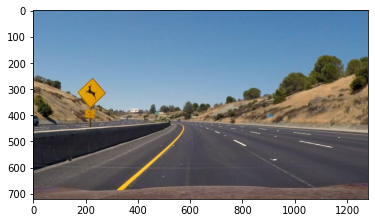

In [34]:
# Directory with our training horse pictures
test_images1 = os.path.join('/content/test_images')
test_images = os.listdir(test_images1)
print(test_images)
for i in range(len(test_images)):
  image = mpimg.imread('test_images'+'/'+str(test_images[i]))
  print('This image is:', type(image), 'with dimensions:', image.shape)
  plt.imshow(image)  
  print('\nThis image is distorted')





## **Reading and plotting a test image from test_images**¶


This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)

This image is distorted


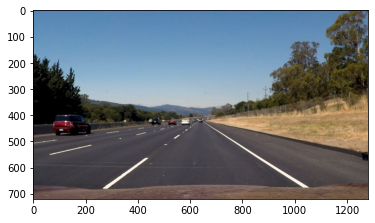

In [35]:
#image = cv2.imread('test_images/straight_lines2.jpg')
image = mpimg.imread('test_images/straight_lines2.jpg')
image123 = mpimg.imread('test_images/test5.jpg')
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  
print('\nThis image is distorted')

## ***Calibrating the Camera on camera_cal images¶***

using folder camera_cal to calpirate chess image

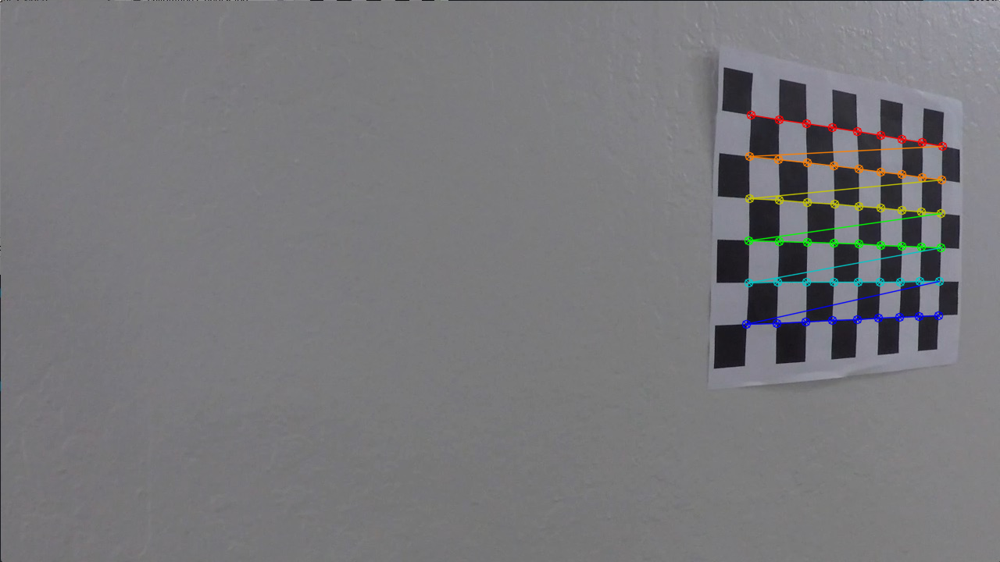

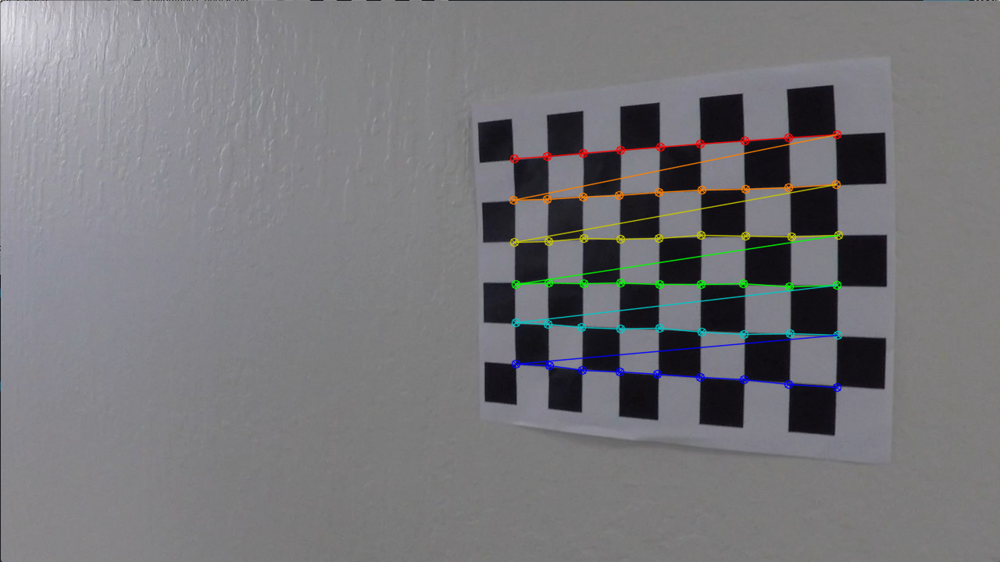

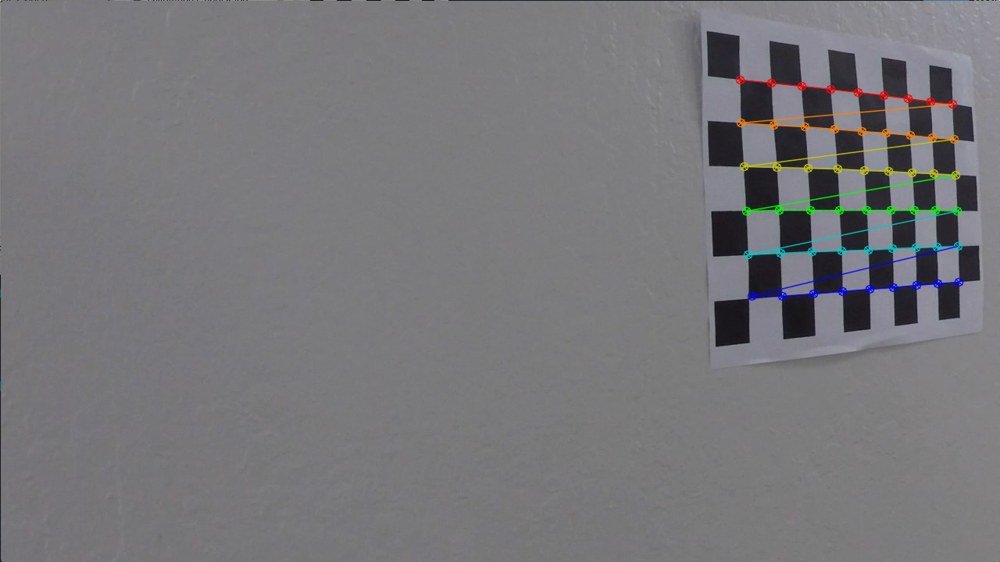

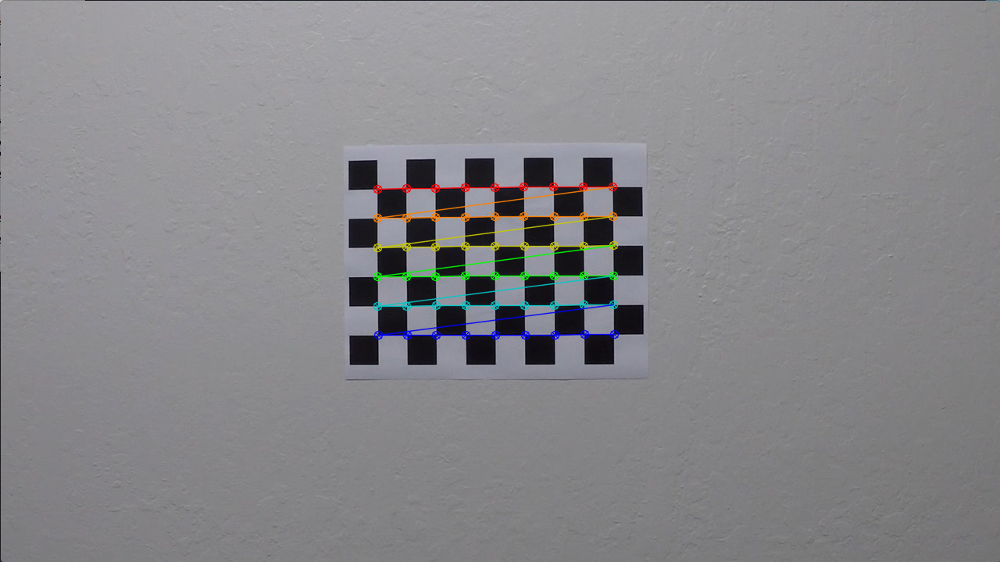

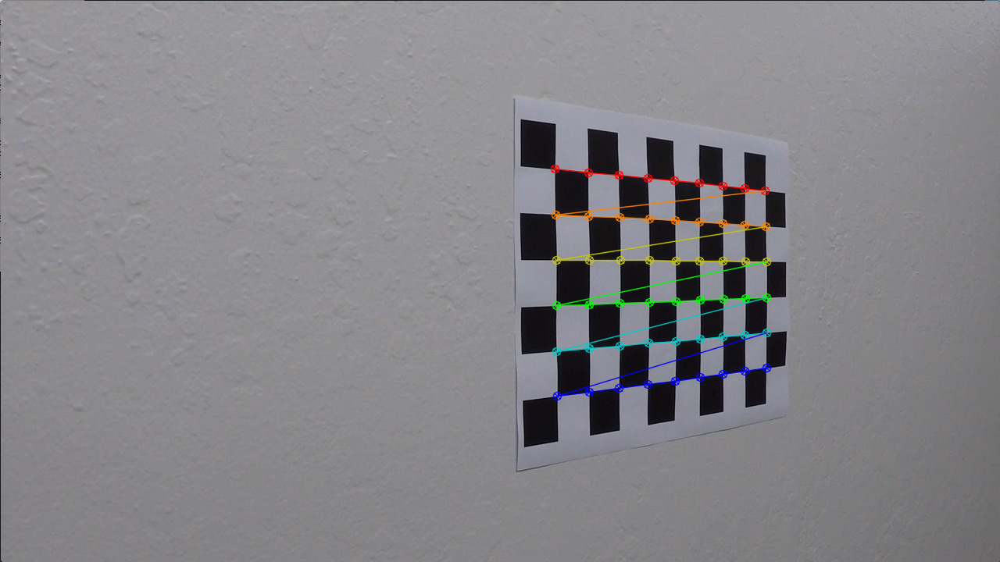

...

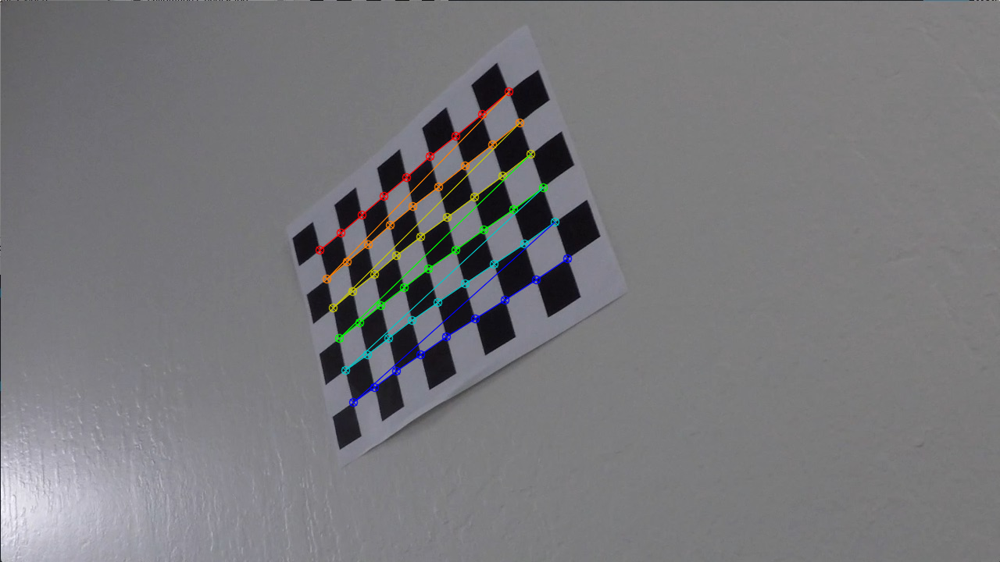

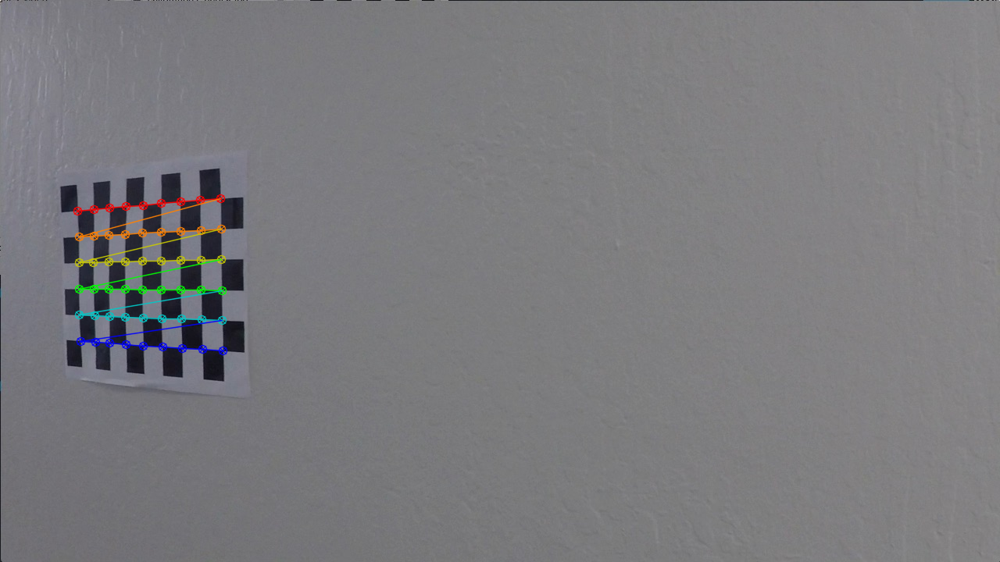

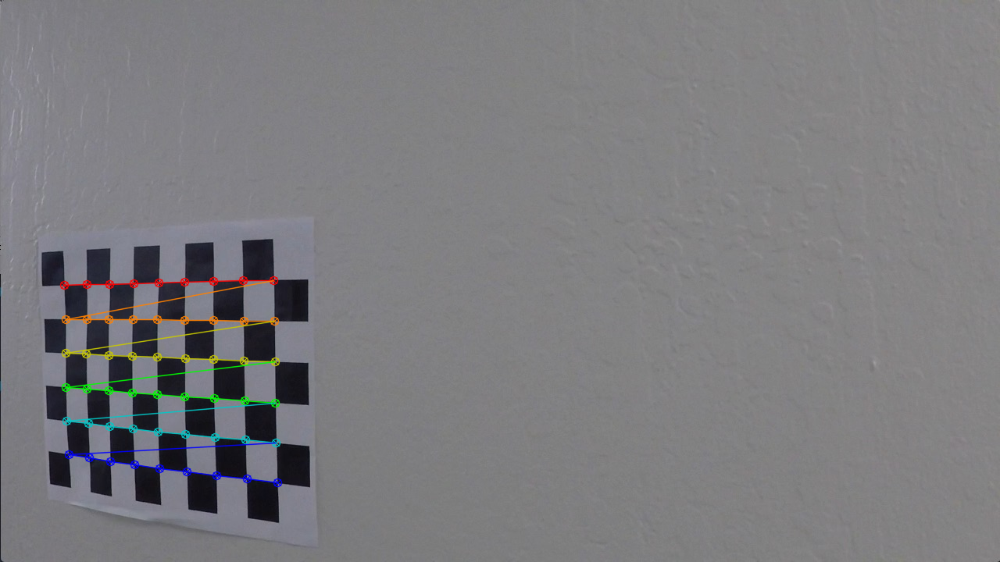

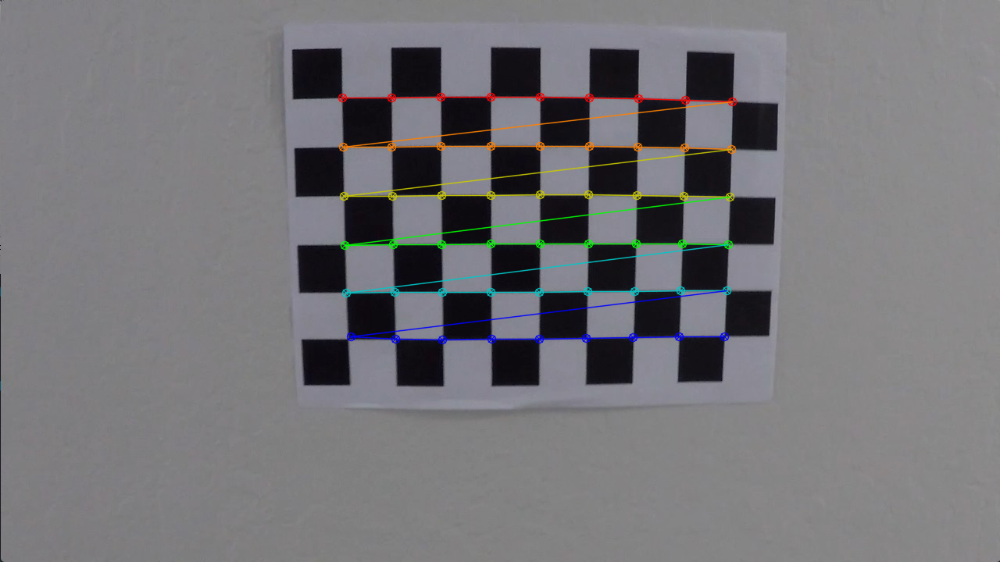

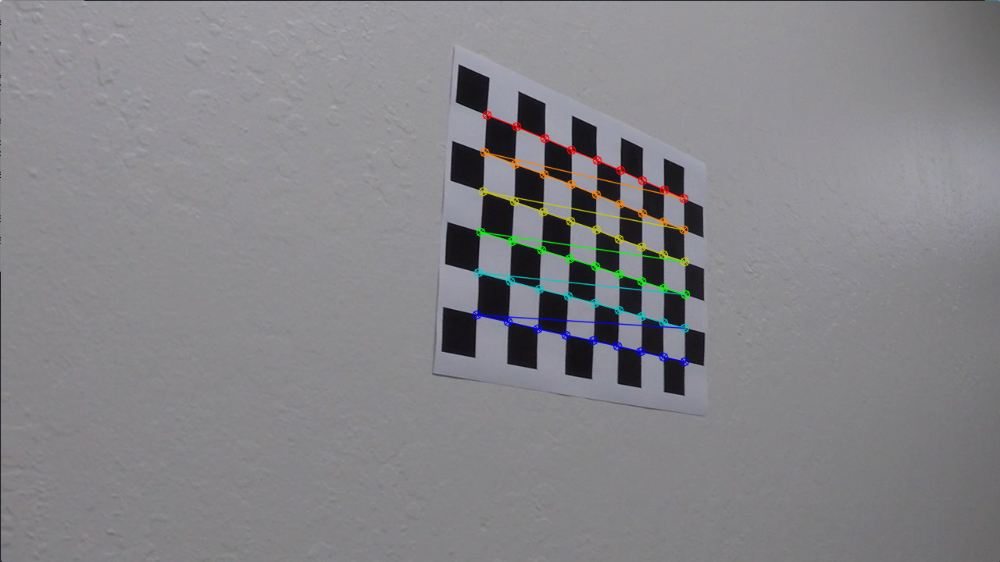

In [40]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2_imshow(img)
        cv2.waitKey(0)

cv2.destroyAllWindows()

## ***Function for Undistorting an image and calibrate camera ***
 

[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]
[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]
[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]
[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]
[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]
[[-0.24688833 -0.02372817 -0.00109843  0.00035105 -0.00259134]]

These images are undistorted


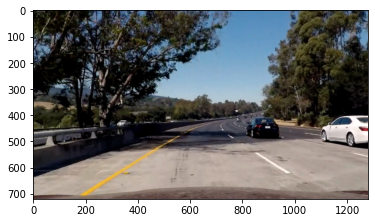

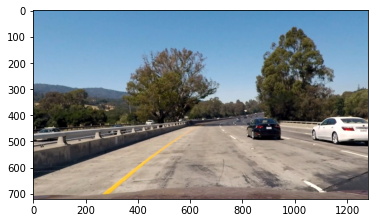

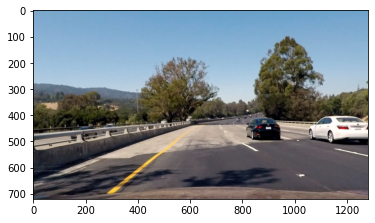

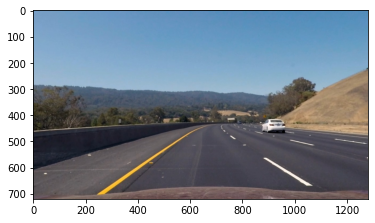

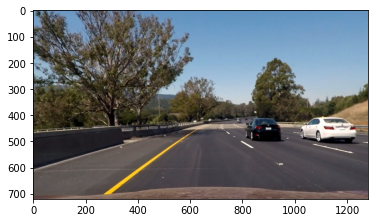

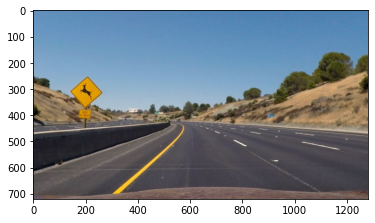

In [42]:
undist_array = []

def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    print( dist)
    return undist

test_images = glob.glob('test_images/test*.jpg')


for fname in test_images:
    image1 = mpimg.imread(fname)
    undistorted = cal_undistort(image1, objpoints, imgpoints)
    undist_array.append(undistorted)
    plt.figure()
    plt.imshow(undistorted)

print('\nThese images are undistorted')

## ***hyperparameters***

In [0]:
thresh_min = 20
thresh_max = 100
s_thresh_min = 170
s_thresh_max = 255

## ***Converting undistorted images to thresholded binary images***


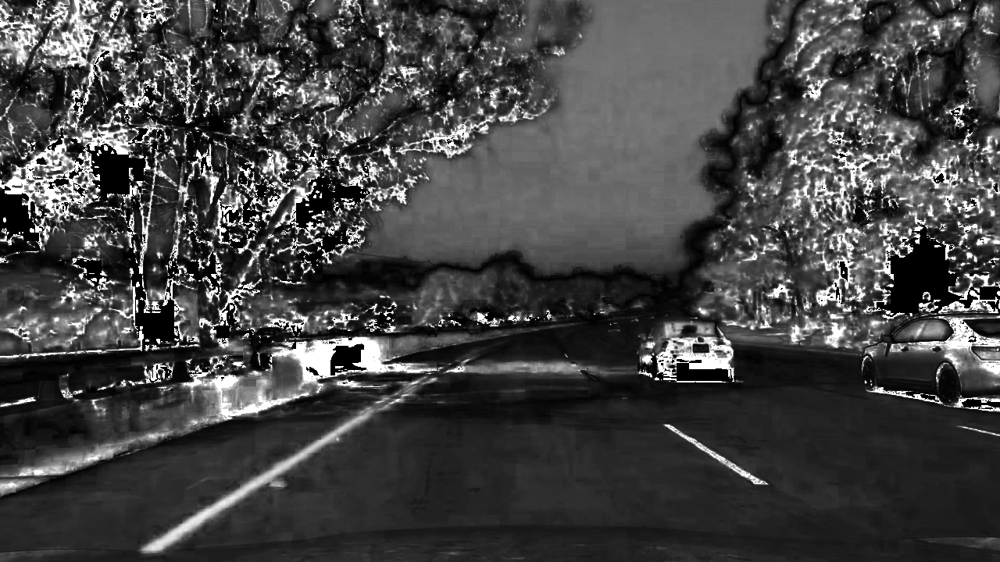

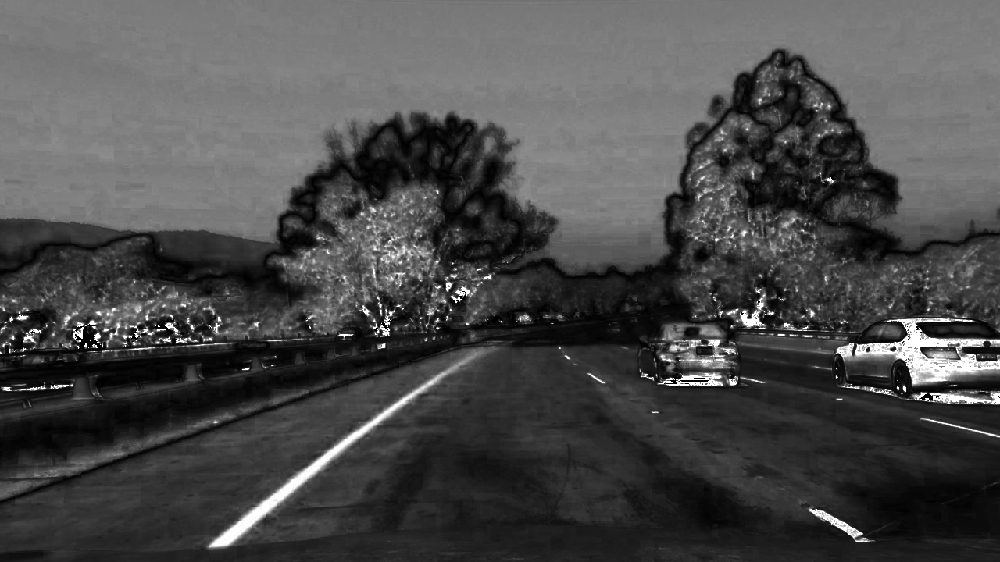

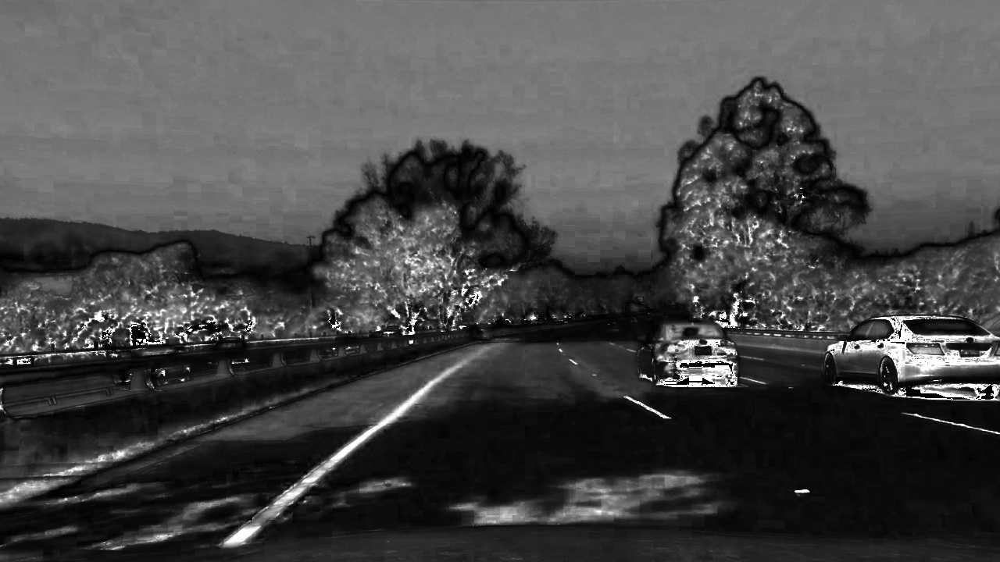

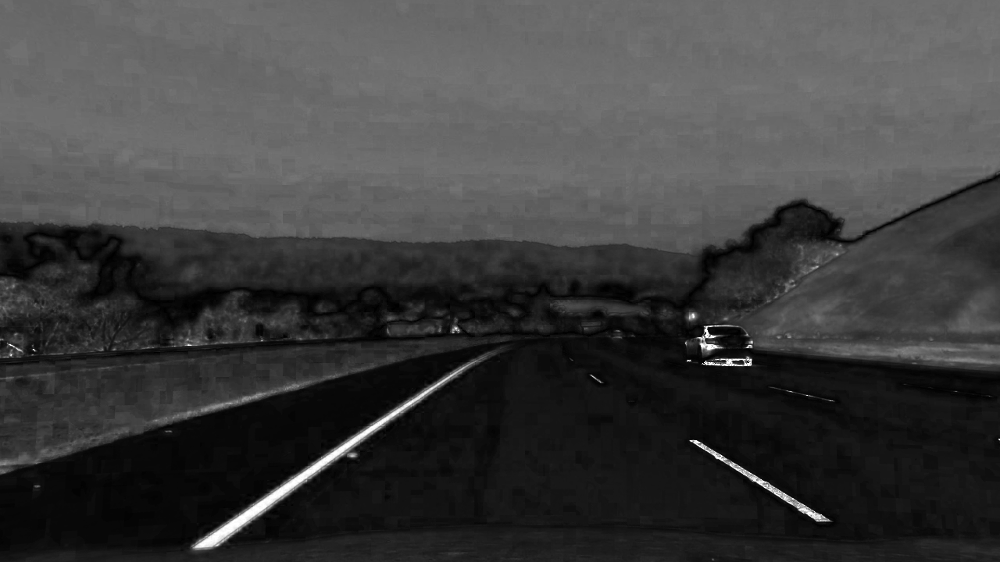

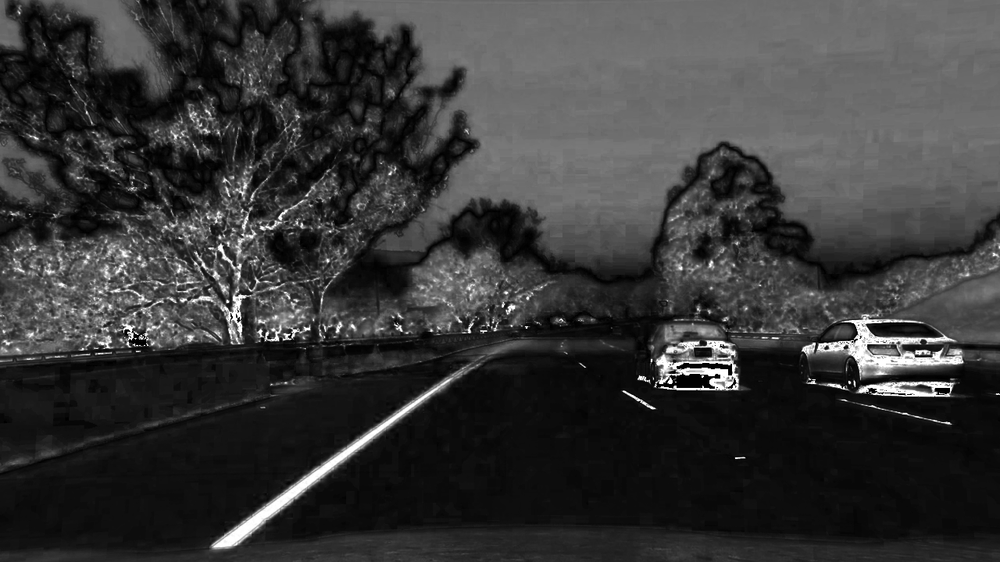

...

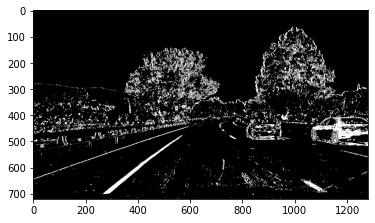

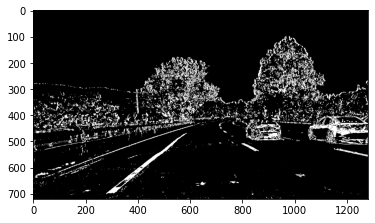

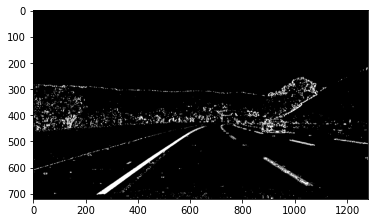

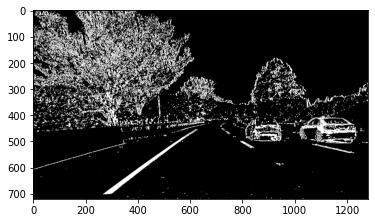

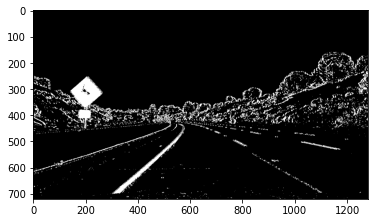

In [46]:
binary_image_array = []

for image in undist_array:
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

    s_channel = hls[:,:,2]
    
    cv2_imshow(s_channel)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x

    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal

    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    sxbinary = np.zeros_like(scaled_sobel)

    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    s_binary = np.zeros_like(s_channel)

    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    combined_binary = np.zeros_like(sxbinary)

    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    binary_image_array.append(combined_binary)

    plt.figure()

    plt.imshow(combined_binary, cmap='gray')

## ***parameters to prespectrive transform undistortion***

In [0]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

img_size = (image.shape[1], image.shape[0])

src = np.float32([[585, 460],[203, 720],[1127, 720],[695, 460]])

dst = np.float32([[320,0],[320,720],[960, 720],[960, 0]])

## return matrix transformation

M = cv2.getPerspectiveTransform(src, dst)

M_inverse = cv2.getPerspectiveTransform(dst, src)

In [0]:
def warper(img, src, dst):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

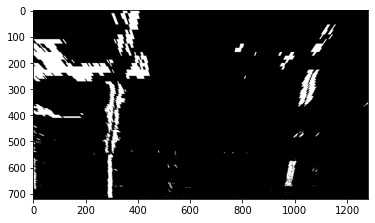

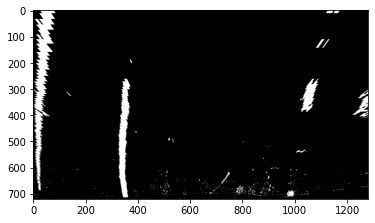

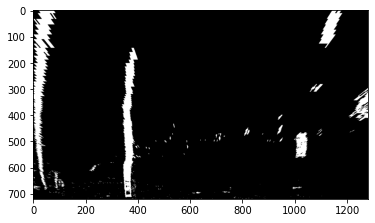

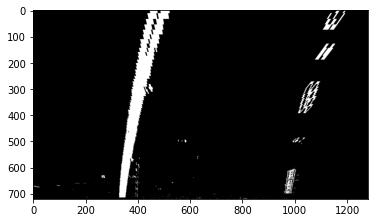

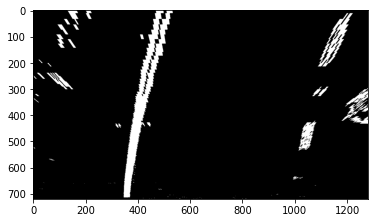

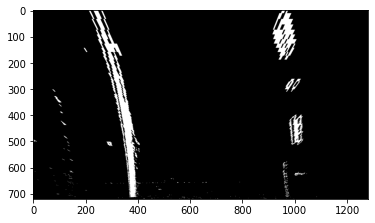

In [51]:
binary_warped_images = []
for img in binary_image_array:
    warped_image = warper(img, src, dst)
    #warped_image_gray = cv2.cvtColor(warped_image,cv2.COLOR_BGR2GRAY)
    plt.figure()
    plt.imshow(warped_image, cmap='gray')
    binary_warped_images.append(warped_image)

## 
**Finding Lane Pixels and fitting a polynomial using Sliding Window¶**



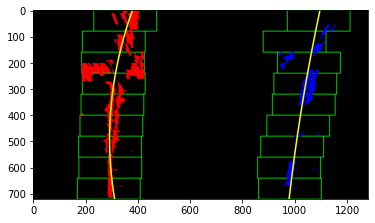

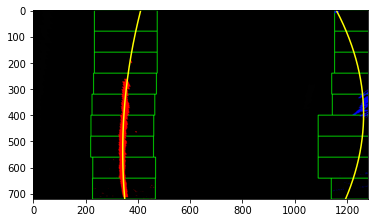

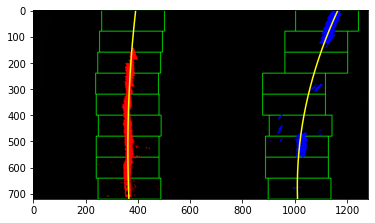

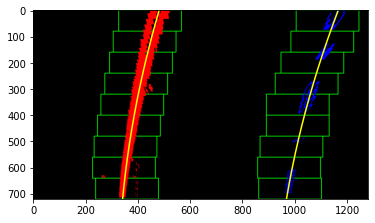

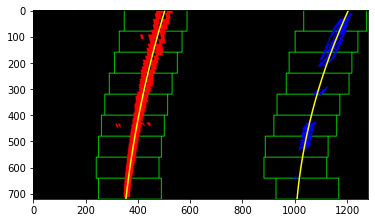

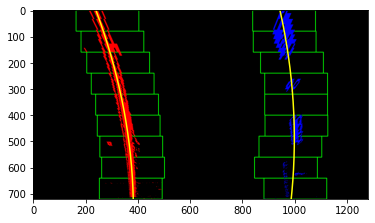

<Figure size 432x288 with 0 Axes>

In [52]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 120
    # Set minimum number of pixels found to recenter window
    minpix = 60

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img


#out_img = fit_polynomial(binary_warped_images[0])
#plt.imshow(out_img)
for img in binary_warped_images:
    result = fit_polynomial(img)
    plt.imshow(result)
    plt.figure()

## ***Function for finding the radius of curvature***
